# Step 1. Introduction.
## Project Description
You work at a startup that sells food products. You need to investigate user behavior for the company's app.

First study the core parameters and sales funnel. Find out how users reach the purchase stage. How many users actually make it to this stage? How many get stuck at previous stages? Which stages in particular? How long does it take to make a purchase?
Then look at the results of an A/A/B test. 
The users are split into three groups: two control groups get the old fonts and one test group gets the new ones. Compare two control groups to make sure that they are similar. That will mean that the experiment was disigned correctly and we can be confident in the accuracy of our testing. Compare control and test groups. Find out which set of fonts produces better results. Is the difference between A and B groups statistically significant? Do the new fonts really influence the users behavior?
We'll'll be using the same dataset for general analytics and for A/A/B analysis. 

## Initialization

In [1]:
%pip install sidetable

Note: you may need to restart the kernel to use updated packages.


In [2]:
%pip install cufflinks plotly

     |████████████████████████████████| 81 kB 11.3 MB/s eta 0:00:01
  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=67922 sha256=018f97b9af2cedf722b32337ce40364a78d05bb890ce18d80c66130d44ff0253
  Stored in directory: /home/jovyan/.cache/pip/wheels/29/b4/f8/2fd2206eeeba6ccad8167e4e8894b8c4ec27bf1342037fd136
Successfully built cufflinks
Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import sidetable
import warnings
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import iplot, init_notebook_mode
from scipy import stats as st
import math as mth
# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

## Open the data file and read the general information

In [4]:
try:
    data = pd.read_csv('logs_exp_us.csv', sep='\t')
except:
    data = pd.read_csv('/datasets/logs_exp_us.csv', sep='\t')

In [5]:
data

,EventName,DeviceIDHash,EventTimestamp,ExpId
0,MainScreenAppear,4575588528974610257,1564029816,246
1,MainScreenAppear,7416695313311560658,1564053102,246
2,PaymentScreenSuccessful,3518123091307005509,1564054127,248
3,CartScreenAppear,3518123091307005509,1564054127,248
4,PaymentScreenSuccessful,6217807653094995999,1564055322,248
...,...,...,...,...
244121,MainScreenAppear,4599628364049201812,1565212345,247
244122,MainScreenAppear,5849806612437486590,1565212439,246
244123,MainScreenAppear,5746969938801999050,1565212483,246
244124,MainScreenAppear,5746969938801999050,1565212498,246


There are 224126 rows 4 columns of data. 

Description of the data.
Each log entry is a user action or an event.
- EventName — event name
- DeviceIDHash — unique user identifier
- EventTimestamp — event time
- ExpId — experiment number: 246 and 247 are the control groups, 248 is the test group

# Step 2. Prepare the data for analysis
## Rename the columns in a way that's convenient for you



In [6]:
data.columns=['event_name', 'uid', 'timestamp', 'exp_id']
data.head()

,event_name,uid,timestamp,exp_id
0,MainScreenAppear,4575588528974610257,1564029816,246
1,MainScreenAppear,7416695313311560658,1564053102,246
2,PaymentScreenSuccessful,3518123091307005509,1564054127,248
3,CartScreenAppear,3518123091307005509,1564054127,248
4,PaymentScreenSuccessful,6217807653094995999,1564055322,248


Now all column names are ok.

## Check for missing values and data types. Correct the data if needed


In [7]:
#check missing values in data
data.stb.missing(style=True)

,missing,total,percent
event_name,0,"244,126",0.00%
uid,0,"244,126",0.00%
timestamp,0,"244,126",0.00%
exp_id,0,"244,126",0.00%


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244126 entries, 0 to 244125
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   event_name  244126 non-null  object
 1   uid         244126 non-null  int64 
 2   timestamp   244126 non-null  int64 
 3   exp_id      244126 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 7.5+ MB


In [9]:
data.event_name.unique()

array(['MainScreenAppear', 'PaymentScreenSuccessful', 'CartScreenAppear',
       'OffersScreenAppear', 'Tutorial'], dtype=object)

In [10]:
data.describe(include='all')

,event_name,uid,timestamp,exp_id
count,244126,2.441260e+05,2.441260e+05,244126.000000
unique,5,NaN,NaN,NaN
top,MainScreenAppear,NaN,NaN,NaN
freq,119205,NaN,NaN,NaN
mean,NaN,4.627568e+18,1.564914e+09,247.022296
std,NaN,2.642425e+18,1.771343e+05,0.824434
min,NaN,6.888747e+15,1.564030e+09,246.000000
25%,NaN,2.372212e+18,1.564757e+09,246.000000
50%,NaN,4.623192e+18,1.564919e+09,247.000000
75%,NaN,6.932517e+18,1.565075e+09,248.000000


At first sight all datatypes are ok, no explicit missing values, no negative or weird data. Timestamp values are now int64, show seconds, but we need date and time, so this column needs converting.

## Add a date and time column and a separate column for dates

In [11]:
# Convert the 'timestamp' column to datetime
data['date_time'] = pd.to_datetime(data['timestamp'], unit='s')
data['date_time']

0        2019-07-25 04:43:36
1        2019-07-25 11:11:42
2        2019-07-25 11:28:47
3        2019-07-25 11:28:47
4        2019-07-25 11:48:42
                 ...        
244121   2019-08-07 21:12:25
244122   2019-08-07 21:13:59
244123   2019-08-07 21:14:43
244124   2019-08-07 21:14:58
244125   2019-08-07 21:15:17
Name: date_time, Length: 244126, dtype: datetime64[ns]

In [12]:
# Extract the date and time components
data['date'] = data['date_time'].dt.date
data.date

0         2019-07-25
1         2019-07-25
2         2019-07-25
3         2019-07-25
4         2019-07-25
             ...    
244121    2019-08-07
244122    2019-08-07
244123    2019-08-07
244124    2019-08-07
244125    2019-08-07
Name: date, Length: 244126, dtype: object

Now date values are object type, let's convert them to datetime format.

In [13]:
data['date'] = pd.to_datetime(data['date'])
data.date

0        2019-07-25
1        2019-07-25
2        2019-07-25
3        2019-07-25
4        2019-07-25
            ...    
244121   2019-08-07
244122   2019-08-07
244123   2019-08-07
244124   2019-08-07
244125   2019-08-07
Name: date, Length: 244126, dtype: datetime64[ns]

In [14]:
data.date.min()

Timestamp('2019-07-25 00:00:00')

In [15]:
data.date.max()

Timestamp('2019-08-07 00:00:00')

So the data was gathered from 25.07.2019 to 7.08.2019 - just 2 weeks!

## Duplicates

In [16]:
data.duplicated().sum()

413

In [17]:
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(data[data.duplicated()])

                     event_name                  uid   timestamp  exp_id  \
453            MainScreenAppear  5613408041324010552  1564474784     248   
2350           CartScreenAppear  1694940645335807244  1564609899     248   
3573           MainScreenAppear   434103746454591587  1564628377     248   
4076           MainScreenAppear  3761373764179762633  1564631266     247   
4803           MainScreenAppear  2835328739789306622  1564634641     248   
5641           CartScreenAppear  4248762472840564256  1564637764     248   
5875    PaymentScreenSuccessful  6427012997733591237  1564638452     248   
7249         OffersScreenAppear  7224691986599895551  1564641846     246   
8065           CartScreenAppear  8189122927585332969  1564643929     248   
9179           MainScreenAppear  2230705996155527339  1564646087     246   
9311           MainScreenAppear  5496043151846125970  1564646283     248   
9990    PaymentScreenSuccessful  7035352794299231933  1564647627     248   
12454   Paym

Let's check the distribution of duplicates across columns.

In [18]:
for i in data[data.duplicated()].columns:
    print(i,':', data[data.duplicated()][i].nunique())

event_name : 5
uid : 237
timestamp : 352
exp_id : 3
date_time : 352
date : 9


In [19]:
data[data.duplicated()].date.unique()

array(['2019-07-30T00:00:00.000000000', '2019-07-31T00:00:00.000000000',
       '2019-08-01T00:00:00.000000000', '2019-08-02T00:00:00.000000000',
       '2019-08-03T00:00:00.000000000', '2019-08-04T00:00:00.000000000',
       '2019-08-05T00:00:00.000000000', '2019-08-06T00:00:00.000000000',
       '2019-08-07T00:00:00.000000000'], dtype='datetime64[ns]')

We see that duplicates appeared in all 3 groups, all 5 event_names on 9 dates, so they seem to be random, no single group or event is responsible for duplicates. Let's delete them from data.

In [20]:
data.drop_duplicates(inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 243713 entries, 0 to 244125
Data columns (total 6 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   event_name  243713 non-null  object        
 1   uid         243713 non-null  int64         
 2   timestamp   243713 non-null  int64         
 3   exp_id      243713 non-null  int64         
 4   date_time   243713 non-null  datetime64[ns]
 5   date        243713 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(3), object(1)
memory usage: 13.0+ MB


So we have dropped 413 duplicated rows, which constitute just 0.16% of the initial data.

## **Conclusion**
A/A/B testing data (224126 rows 4 columns) was prepared for analysis: 
- columns were renamed
- datatypes, missing values, weird data were checked - everything is ok
- date_time column and a separate column for dates in datetime64T format were added
- duplicates were found and dropped(413 rows).

After the preprocessing we lost 0.16% of initial data, so now there are 243713 rows 6 columns of data. 

# Step 3. Study and check the data

## How many events are in the logs?

In [21]:
data.event_name.value_counts()

MainScreenAppear           119101
OffersScreenAppear          46808
CartScreenAppear            42668
PaymentScreenSuccessful     34118
Tutorial                     1018
Name: event_name, dtype: int64

There are 5 different events, they are not equally spread: MainScreenAppea is the most frequent event, Tutorial is 100 times less frequent. A user may stop at any stage or may go through all events to successful payment.
The first four events are logically ordered by time one after another: 

1.MainScreenAppear >  2.OffersScreenAppear > 3.CartScreenAppear > 4.PaymentScreenSuccessful. Users can skip some stages in the chain, they are not obligatory. We will see later whether users always follow this logical sequence or not .

But Tutorial can appear at any moment, before/after any stage or can be the only event of a certain user.

## How many users are in the logs?

In [22]:
data.uid.nunique()

7551

There are 7551 users in the log. Let's see how they are destributed by groups during the experiment.

In [23]:
user_group=data.groupby(['exp_id']).uid.nunique().reset_index()
user_group

,exp_id,uid
0,246,2489
1,247,2520
2,248,2542


The three groups don't differ much by the number of users, they are all big enough for conducting A/A/B test.

In [24]:
user_group.uid.sum()

7551

Summed number of users per groups gives us exactly the total number of unique users that we found above, so there are no users belonging to different groups at the same time - that's a good sign! Let's check total number of events per group:

The total numbers of events per group are also comparable.

## What's the average number of events per user?

Let's first group data by user and find total number of events and number of unique events per user.

In [25]:
user=data.groupby('uid').event_name.agg(['count','nunique']).reset_index()
user.columns=['uid', 'total_events', 'unique_events']
user

,uid,total_events,unique_events
0,6888746892508752,1,1
1,6909561520679493,5,4
2,6922444491712477,47,4
3,7435777799948366,6,1
4,7702139951469979,137,4
...,...,...,...
7546,9217594193087726423,9,3
7547,9219463515465815368,17,4
7548,9220879493065341500,7,3
7549,9221926045299980007,7,1


In [26]:
user.describe()

,uid,total_events,unique_events
count,7.551000e+03,7551.000000,7551.000000
mean,4.677319e+18,32.275593,2.674480
std,2.655343e+18,65.154219,1.454287
min,6.888747e+15,1.000000,1.000000
25%,2.397700e+18,9.000000,1.000000
50%,4.688022e+18,20.000000,3.000000
75%,7.007353e+18,37.000000,4.000000
max,9.222603e+18,2307.000000,5.000000


The describe method applied to user table tells us much about users. 

The number of events per user varies from 1 to 2307, so the users differ very much. The mean value is 32, while the median is lower - 20 events,  Q3 is 37, so the distribution is right skewed with many upper outliers.
Let's vizualize the distribution with a histogram.

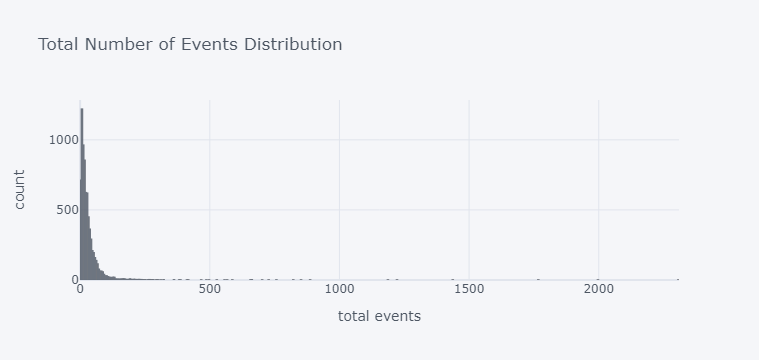

In [27]:
user['total_events'].iplot(kind='hist', xTitle='total events',
                  yTitle='count', title='Total Number of Events Distribution')

75% of users have less than 37 events, but there are outliers having 500, 1000 and more events. Boxplot will show the picture in the following way:

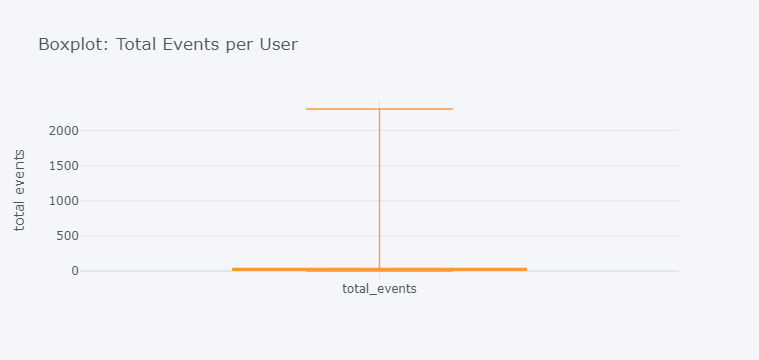

In [28]:
user['total_events'].iplot(
        kind='box',
        yTitle='total events',
        title='Boxplot: Total Events per User')

The number of unique events per user varies from 1 to 5(no wonder), the mean  < the median(2.67 VS 3), so the distribution has a little left skew. Let's see how often users have each number of events.

In [29]:
user.unique_events.value_counts().sort_index()

1    2707
2    1021
3     317
4    3035
5     471
Name: unique_events, dtype: int64

3035 users go through 4 stages, 2707 have only 1 unique event (any ofwe don't know which one). Only 471 users go through all 5 events. This fact doesn't mean that only 471 users make successful payment - only some of users take Tutorial, and users may come to the final stage after skipping some previous events and make successful payment as well.

## What period of time does the data cover? Find the maximum and the minimum date. Plot a histogram by date and time. Can you be sure that you have equally complete data for the entire period? Older events could end up in some users' logs for technical reasons, and this could skew the overall picture. Find the moment at which the data starts to be complete and ignore the earlier section. What period does the data actually represent?

When we looked through date_time column we found out that the data covers the period of time from 25.07.2019 to 7.08.2019, these are min and max values in the column. Let's plot a histogram by date and time with plotly express.

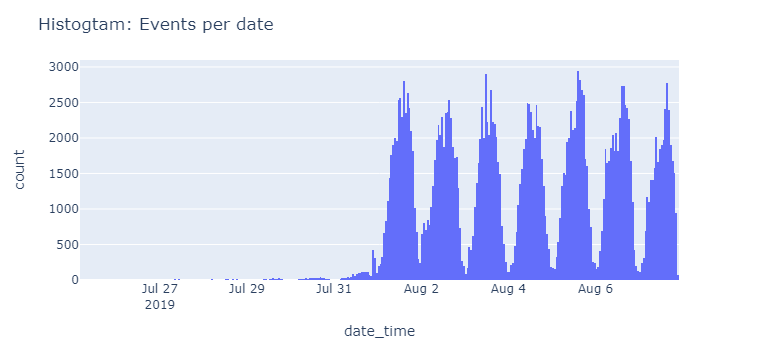

In [30]:
import plotly.express as px
fig = px.histogram(data, x="date_time")
fig.update_layout(title='Histogtam: Events per date')
fig.show()

There ia a striking difference in the plot between two periods before and after Aug 1 2019. It seems like some users were assigned to experimental groups in July , but the real experiment started only on Aug 1. It's impossible to treat the data as one, because July data are obviously incomplete for some reason(they were part of another previous test with the same groups assigned or some tecnical issue influenced the picture) and they can skew the results of our experiment. Let's exclude July data from the analysis and take into consideration only data since Aug 1 2019.

In [31]:
df = data[data['date'] >= '2019-08-01']
df

,event_name,uid,timestamp,exp_id,date_time,date
2828,Tutorial,3737462046622621720,1564618048,246,2019-08-01 00:07:28,2019-08-01
2829,MainScreenAppear,3737462046622621720,1564618080,246,2019-08-01 00:08:00,2019-08-01
2830,MainScreenAppear,3737462046622621720,1564618135,246,2019-08-01 00:08:55,2019-08-01
2831,OffersScreenAppear,3737462046622621720,1564618138,246,2019-08-01 00:08:58,2019-08-01
2832,MainScreenAppear,1433840883824088890,1564618139,247,2019-08-01 00:08:59,2019-08-01
...,...,...,...,...,...,...
244121,MainScreenAppear,4599628364049201812,1565212345,247,2019-08-07 21:12:25,2019-08-07
244122,MainScreenAppear,5849806612437486590,1565212439,246,2019-08-07 21:13:59,2019-08-07
244123,MainScreenAppear,5746969938801999050,1565212483,246,2019-08-07 21:14:43,2019-08-07
244124,MainScreenAppear,5746969938801999050,1565212498,246,2019-08-07 21:14:58,2019-08-07


## Did you lose many events and users when excluding the older data?


In [32]:
len(data)-len(df)

2826

In [33]:
(len(data)-len(df))/len(data)

0.011595606307418972

Filtered df contains only 240887 rows out of 243713 rows of initial data, so we dropped 2826 events(rows) or 1,16% of data( that's quite acceptable).

Let's check if we still  have users from all three experimental groups.

In [34]:
user_group_df=df.groupby(['exp_id']).uid.nunique().reset_index()
user_group_df

,exp_id,uid
0,246,2484
1,247,2513
2,248,2537


Groups are still more or less comparable, they are now just 5-7 users less than before:

In [35]:
user_group=data.groupby(['exp_id']).uid.nunique().reset_index()
user_group

,exp_id,uid
0,246,2489
1,247,2520
2,248,2542


In [36]:
data.uid.nunique()-df.uid.nunique()

17

Only 17 users dropped. What's the share of lost users?

In [37]:
(data.uid.nunique()-df.uid.nunique())/data.uid.nunique()

0.0022513574361011784

So we lost in all 0.2% of users.

Let's check how the number of events per group has changed.

In [38]:
data.exp_id.value_counts()

248    85582
246    80181
247    77950
Name: exp_id, dtype: int64

In [39]:
df.exp_id.value_counts()

248    84563
246    79302
247    77022
Name: exp_id, dtype: int64

Yes, the groups are still comparable by number of events too. Each of the groups has lost about 900 events, now the difference between groups in number of users is not significant. 

What about unique events?

In [40]:
data.event_name.value_counts()

MainScreenAppear           119101
OffersScreenAppear          46808
CartScreenAppear            42668
PaymentScreenSuccessful     34118
Tutorial                     1018
Name: event_name, dtype: int64

In [41]:
df.event_name.value_counts()

MainScreenAppear           117328
OffersScreenAppear          46333
CartScreenAppear            42303
PaymentScreenSuccessful     33918
Tutorial                     1005
Name: event_name, dtype: int64

Every event_name has lost some small share of values, but the distribution of values didn't change much.
So we may conclude that by excluding the older data we didn't make any serious distortion of the data and can continue the analysis.

## **Conclusion**

The core paramerers were investigated.
- There are 5 different events in data, 4 of them seem to be organized logically in a time sequence:
1.MainScreenAppear > 2.OffersScreenAppear > 3.CartScreenAppear > 4.PaymentScreenSuccessful
The 5th event - Tutorial - is optional. The real sequence of events has to be revealed. 
Events are not equally spread: MainScreenAppea is the most frequent event(119101), Tutorial is 100 times less frequent.
- There are 7551 users in the log distributed by groups almost equally.
- The total numbers of events per group are also comparable.
- The number of events per user varies from 1 to 2307, the mean = 32, the median = 20 events.
- The number of unique events per user varies from 1 to 5.
- Data covers the period of time from 25.07.2019 to 7.08.2019,
There ia a striking difference between two periods before and after Aug 1 2019. It seems like some users were assigned to experimental groups in July , but the real experiment started only on Aug 1. It's impossible to treat the data as one, because July data are obviously incomplete, so July data were excluded from the further analysis.

Filtered df contains 240887 rows, so 2826 rows representing events were dropped (1,16% of events), 17 users (0.2% of initial number) lost. All unique event names are preserved.
New filtered groups are still comparable, and the distribution of  values  per groups and per event_names didn't change much. So we didn't make any serious distortion of the data by excluding the older information and can continue the analysis.

# Step 4. Study the event funnel
## See what events are in the logs and their frequency of occurrence. Sort them by frequency. Find the number of users who performed each of these actions. Sort the events by the number of users.The core paramerers were investigated.


Now let's group values by event_name and find frequensy of occurence and number of users.

In [42]:
event = df.groupby(['event_name'])['uid'].agg(['count', 'nunique']).sort_values(by = 'count', ascending=False)
event.columns = ['total', 'unique_uid']
event=event.reset_index()
event

,event_name,total,unique_uid
0,MainScreenAppear,117328,7419
1,OffersScreenAppear,46333,4593
2,CartScreenAppear,42303,3734
3,PaymentScreenSuccessful,33918,3539
4,Tutorial,1005,840


We see that  number of unique users per event decreases with the order of events sorted by total occurence. MainScreenAppear is the most frequent event with the biggest number of users. OffersScreenAppear is 2.5 times less frequent and has 1.6 times less users. Values for CartScreenAppear and PaymentScreenSuccessful also decrease, but the difference between them and the previous stages is not so significant. Tutorial stays apart, it doesn't necessarily follow any of the previous events and has min frequence of occurence and min number of users.

Let's vizualize our results.

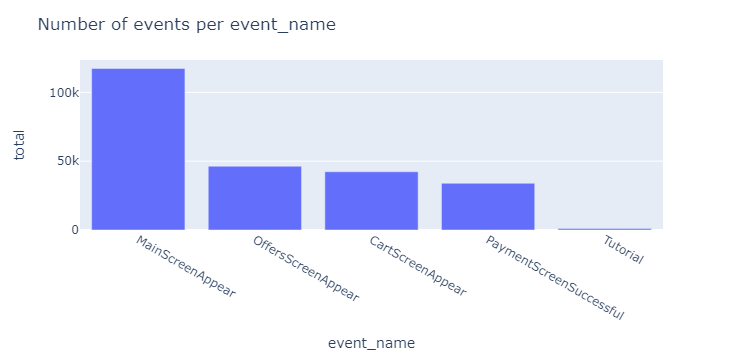

In [43]:
fig = px.bar(event, x='event_name', y='total')
fig.update_layout(title='Number of events per event_name')
fig.show()

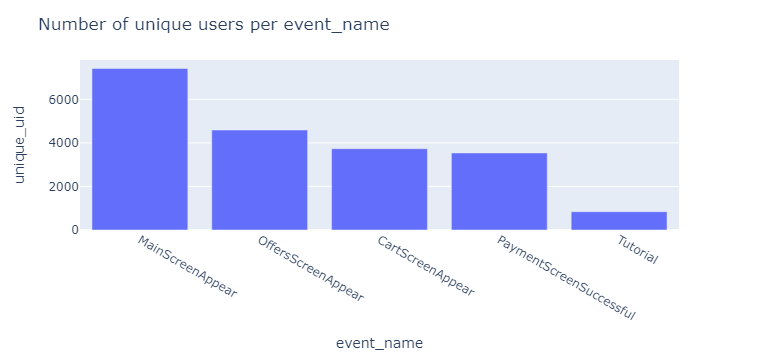

In [44]:
fig = px.bar(event, x='event_name', y='unique_uid')
fig.update_layout(title='Number of unique users per event_name')
fig.show()

## Calculate the proportion of users who performed the action at least once.

We need to fing the share of unique users at each stage. Let's devide the number of unique users performing a certain event by the total number of unique users.

In [45]:
event['user_share'] = event.unique_uid/df.uid.nunique()
event

,event_name,total,unique_uid,user_share
0,MainScreenAppear,117328,7419,0.984736
1,OffersScreenAppear,46333,4593,0.609636
2,CartScreenAppear,42303,3734,0.495620
3,PaymentScreenSuccessful,33918,3539,0.469737
4,Tutorial,1005,840,0.111495


The biggest users loss comes between the events MainScreenAppear and OffersScreenAppear(from 98% to 61%). The smallest loss comes between the events CartScreenAppear and PaymentScreenSuccessful (49.5% - 47%),  so less than 3% of users who have put orders in the cart do not pay for it. 
Only 11% of users opened Tutorial, but we can't speak about it in terms of a loss, because Tutorial can be the first and the only event of a user.

## In what order do you think the actions took place. Are all of them part of a single sequence? You don't need to take them into account when calculating the funnel.

We suppose that the actions took place in the following order:
**MainScreenAppear  >  OffersScreenAppear > CartScreenAppear > PaymentScreenSuccessful**.

Some stages can be omitted(e.g. one-click purchase), but these events are logically connected.

Tutorial is a special event that has no fixed place in event sequence. So Tutorial shouldn't be taken into account when calculating the funnel.

Let's exclude Tutorial from the following analysis.

In [46]:
sorted_df=df[df['event_name']!='Tutorial'].sort_values(by=['uid','timestamp'])
sorted_df.sample()

,event_name,uid,timestamp,exp_id,date_time,date
172840,OffersScreenAppear,7586870289028771156,1565030451,247,2019-08-05 18:40:51,2019-08-05


Let's look at all events of some active user.

In [47]:
sorted_df[sorted_df.uid==8619840625096464102]

,event_name,uid,timestamp,exp_id,date_time,date
27388,MainScreenAppear,8619840625096464102,1564674740,248,2019-08-01 15:52:20,2019-08-01
27392,CartScreenAppear,8619840625096464102,1564674742,248,2019-08-01 15:52:22,2019-08-01
27393,PaymentScreenSuccessful,8619840625096464102,1564674742,248,2019-08-01 15:52:22,2019-08-01
27395,MainScreenAppear,8619840625096464102,1564674743,248,2019-08-01 15:52:23,2019-08-01
27407,OffersScreenAppear,8619840625096464102,1564674754,248,2019-08-01 15:52:34,2019-08-01
...,...,...,...,...,...,...
242976,OffersScreenAppear,8619840625096464102,1565207541,248,2019-08-07 19:52:21,2019-08-07
242992,OffersScreenAppear,8619840625096464102,1565207565,248,2019-08-07 19:52:45,2019-08-07
243025,MainScreenAppear,8619840625096464102,1565207673,248,2019-08-07 19:54:33,2019-08-07
243083,MainScreenAppear,8619840625096464102,1565207922,248,2019-08-07 19:58:42,2019-08-07


Let's check the sequence of events of a certain user in our sorted df. 

def sequence(user) function will find all rows for a user, sort them by date_time, drop duplicated events and return a list of events orderd by time.

In [48]:
def sequence(user):
    sorted_user=sorted_df[sorted_df['uid']==user].sort_values(by=['uid','date_time'])
    return sorted_user['event_name'].drop_duplicates().to_list()

In [49]:
sequence(8619840625096464102)

['MainScreenAppear',
 'CartScreenAppear',
 'PaymentScreenSuccessful',
 'OffersScreenAppear']

We see that OffersScreenAppear comes after PaymentScreenSuccessful and not before CartScreenAppear', as we expected. So there can be many variants of event time sequence.
Now let's append each user's sequence of events  to sequence_empty list.

In [50]:
sequence_empty=[]
for i in sorted_df.uid.unique():
    sequence_empty.append([i,sequence(i)])

We can turn sequence_empty list to a dataframe with columns 'user'and 'path'.

In [51]:
path_data=pd.DataFrame(sequence_empty,columns=['user','path'])
path_data

,user,path
0,6888746892508752,[MainScreenAppear]
1,6909561520679493,"[MainScreenAppear, PaymentScreenSuccessful, Ca..."
2,6922444491712477,"[MainScreenAppear, PaymentScreenSuccessful, Ca..."
3,7435777799948366,[MainScreenAppear]
4,7702139951469979,"[MainScreenAppear, OffersScreenAppear, CartScr..."
...,...,...
7525,9217594193087726423,"[PaymentScreenSuccessful, CartScreenAppear, Of..."
7526,9219463515465815368,"[MainScreenAppear, OffersScreenAppear, CartScr..."
7527,9220879493065341500,"[MainScreenAppear, OffersScreenAppear, CartScr..."
7528,9221926045299980007,[MainScreenAppear]


This df contains paths for every user, and now we can compare real unique paths with our expectations about them. How often the real path follows out expected **MainScreenAppear  >  OffersScreenAppear > CartScreenAppear > PaymentScreenSuccessful** sequence?

In [52]:
path_data['path'].value_counts()

TypeError: unhashable type: 'list'

Exception ignored in: 'pandas._libs.index.IndexEngine._call_map_locations'
Traceback (most recent call last):
  File "pandas/_libs/hashtable_class_helper.pxi", line 4588, in pandas._libs.hashtable.PyObjectHashTable.map_locations
TypeError: unhashable type: 'list'


[MainScreenAppear]                                                                   2882
[MainScreenAppear, OffersScreenAppear, CartScreenAppear, PaymentScreenSuccessful]     905
[MainScreenAppear, OffersScreenAppear]                                                872
[MainScreenAppear, OffersScreenAppear, PaymentScreenSuccessful, CartScreenAppear]     771
[MainScreenAppear, PaymentScreenSuccessful, CartScreenAppear, OffersScreenAppear]     668
[MainScreenAppear, CartScreenAppear, PaymentScreenSuccessful, OffersScreenAppear]     510
[MainScreenAppear, CartScreenAppear, OffersScreenAppear, PaymentScreenSuccessful]     259
[MainScreenAppear, OffersScreenAppear, CartScreenAppear]                               92
[OffersScreenAppear, MainScreenAppear, PaymentScreenSuccessful, CartScreenAppear]      65
[OffersScreenAppear, PaymentScreenSuccessful, CartScreenAppear, MainScreenAppear]      63
[MainScreenAppear, CartScreenAppear, OffersScreenAppear]                               52
[MainScree

Let's analyse the result.
- A. If a user makes only **1 action** , in most cases it is MainScreenAppear(2874), but sometimes also OffersScreenAppear(10). Tutorials are already excluded.
- B. If the user makes **2 actions**: 
    - MainScreenAppear, OffersScreenAppear 863,
    - MainScreenAppear, CartScreenAppear 49
    - OffersScreenAppear, MainScreenAppear 47
    - OffersScreenAppear, CartScreenAppear 2
    - CartScreenAppear, MainScreenAppear 2
    - CartScreenAppear, OffersScreenAppear 1

Important to note that in all cases with 1 or 2 events we never see PaymentScreenSuccessful, so these users didn't actually buy anything.

- C. If the user makes **3 actions**:
    - without Payment: all 6 possible combinations, total 152 
        - MainScreenAppear, OffersScreenAppear, CartScreenAppear  91
        - MainScreenAppear, CartScreenAppear, OffersScreenAppear  52
...
        - CartScreenAppear, OffersScreenAppear, MainScreenAppear  1
    - with Payment: 13 combinations, total 108
        - PaymentScreenSuccessful, CartScreenAppear, OffersScreenAppear 30
        - OffersScreenAppear, PaymentScreenSuccessful, CartScreenAppear 29
        - OffersScreenAppear, CartScreenAppear, PaymentScreenSuccessful  12
...
        - PaymentScreenSuccessful, CartScreenAppear, MainScreenAppear  1

- D. If the user makes **4 actions**:
It includes all 4 events, we see 15 of 24 possible combinations.
    - MainScreenAppear, OffersScreenAppear, CartScreenAppear, PaymentScreenSuccessful     836
    - MainScreenAppear, OffersScreenAppear, PaymentScreenSuccessful, CartScreenAppear     688
    - MainScreenAppear, PaymentScreenSuccessful, CartScreenAppear, OffersScreenAppear     586
    - MainScreenAppear, CartScreenAppear, PaymentScreenSuccessful, OffersScreenAppear     458
    - MainScreenAppear, CartScreenAppear, OffersScreenAppear, PaymentScreenSuccessful     248
    - OffersScreenAppear, MainScreenAppear, PaymentScreenSuccessful, CartScreenAppear     139
    - PaymentScreenSuccessful, CartScreenAppear, MainScreenAppear, OffersScreenAppear      93
    - OffersScreenAppear, MainScreenAppear, CartScreenAppear, PaymentScreenSuccessful      85
    - CartScreenAppear, PaymentScreenSuccessful, MainScreenAppear, OffersScreenAppear      63
    - OffersScreenAppear, PaymentScreenSuccessful, CartScreenAppear, MainScreenAppear      58
    - PaymentScreenSuccessful, CartScreenAppear, OffersScreenAppear, MainScreenAppear      38
    - CartScreenAppear, MainScreenAppear, OffersScreenAppear, PaymentScreenSuccessful      37
    - CartScreenAppear, MainScreenAppear, PaymentScreenSuccessful, OffersScreenAppear      37
    - PaymentScreenSuccessful, MainScreenAppear, CartScreenAppear, OffersScreenAppear       1
    - PaymentScreenSuccessful, OffersScreenAppear, MainScreenAppear, CartScreenAppear       1

So, we see that in each group the most frequent variants start with MainScreen, and in all variants including 4 events the most frequent is our expected sequence MainScreenAppear, OffersScreenAppear, CartScreenAppear, PaymentScreenSuccessful, but also variants where Payment is the 1st or the 2nd after MainScreen.

## What share of users make the entire journey from their first event to payment?

To answer this question we shall take all variants with 4 events no matter when exactly Payment was, at the last position or somewhere else(see section D above).

Let's set target_events as a set of all 4 events:

In [53]:
target_events = set(['MainScreenAppear', 'OffersScreenAppear', 'CartScreenAppear', 'PaymentScreenSuccessful'])
target_events

{'CartScreenAppear',
 'MainScreenAppear',
 'OffersScreenAppear',
 'PaymentScreenSuccessful'}

Let's make full_path df by filtering path_data with lambda function

In [54]:
full_path = path_data[path_data['path'].apply(lambda path: set(path) == target_events)]
full_path

,user,path
1,6909561520679493,"[MainScreenAppear, PaymentScreenSuccessful, Ca..."
2,6922444491712477,"[MainScreenAppear, PaymentScreenSuccessful, Ca..."
4,7702139951469979,"[MainScreenAppear, OffersScreenAppear, CartScr..."
7,9841258664663090,"[MainScreenAppear, OffersScreenAppear, CartScr..."
9,15708180189885246,"[OffersScreenAppear, CartScreenAppear, Payment..."
...,...,...
7518,9212420551954885212,"[MainScreenAppear, OffersScreenAppear, Payment..."
7520,9212961170535635779,"[MainScreenAppear, OffersScreenAppear, CartScr..."
7521,9214668690707156694,"[MainScreenAppear, OffersScreenAppear, Payment..."
7524,9216369613838971606,"[MainScreenAppear, CartScreenAppear, PaymentSc..."


We see 3429 rows in full_path df, this is also the number of users that make the entire journey from their first event to payment. Let's find the share of such users among all unique users.

In [55]:
len(full_path)/path_data.user.nunique()

0.4553784860557769

Another way is to sorted_df(where Tutorial is excluded and 4 other events are present) by uid and find number of unique events for each user, then find users with 4 unique events:

In [56]:
user_event_counts = sorted_df.groupby('uid')['event_name'].nunique().reset_index()
users_with_4_events = user_event_counts[user_event_counts['event_name'] == 4]
len(users_with_4_events)

3429

The result is the same.
So 45.7% of users make the entire journey from their first event to payment, they go through all four stages of the path no matter how these stages are ordered.

## Use the event funnel to find the share of users that proceed from each stage to the next. At what stage do you lose the most users?

Let's make a funnel_shift dataframe by grouping users by event_name and find how their shair changes from stage to stage with pct_change function

In [57]:
funnel_shift=df.groupby(['event_name'])['uid'].nunique().sort_values(ascending=False).reset_index()
funnel_shift

,event_name,uid
0,MainScreenAppear,7419
1,OffersScreenAppear,4593
2,CartScreenAppear,3734
3,PaymentScreenSuccessful,3539
4,Tutorial,840


In [58]:
funnel_shift['perc_ch']=funnel_shift['uid'].pct_change()
funnel_shift

,event_name,uid,perc_ch
0,MainScreenAppear,7419,NaN
1,OffersScreenAppear,4593,-0.380914
2,CartScreenAppear,3734,-0.187024
3,PaymentScreenSuccessful,3539,-0.052223
4,Tutorial,840,-0.762645


38% of the previous stage users were lost at OffersScreenAppear, about 19% at CartScreenAppear and only 5% users lost at PaymentScreenSuccessful.
 
It's clear now that max loss is after the first stage, so the transition from the MainScreen to OffersScreen needs special attention.

## Plot the event funnel

We have 3 groups in the experiment, let's display their funnel results one by one.

In [59]:
funnel_by_groups=[]
for i in data.exp_id.unique():
    group=data[data.exp_id==i].groupby(['event_name','exp_id'])['uid'].nunique().reset_index().sort_values(by='uid',ascending=False)
    display(group)
    funnel_by_groups.append(group)


,event_name,exp_id,uid
1,MainScreenAppear,246,2456
2,OffersScreenAppear,246,1545
0,CartScreenAppear,246,1270
3,PaymentScreenSuccessful,246,1202
4,Tutorial,246,279


,event_name,exp_id,uid
1,MainScreenAppear,248,2501
2,OffersScreenAppear,248,1538
0,CartScreenAppear,248,1239
3,PaymentScreenSuccessful,248,1185
4,Tutorial,248,282


,event_name,exp_id,uid
1,MainScreenAppear,247,2482
2,OffersScreenAppear,247,1530
0,CartScreenAppear,247,1240
3,PaymentScreenSuccessful,247,1160
4,Tutorial,247,286


Let's unite 3 funnels in 1 dataframe with concat()

In [60]:
funnel_by_groups=pd.concat(funnel_by_groups)
funnel_by_groups

,event_name,exp_id,uid
1,MainScreenAppear,246,2456
2,OffersScreenAppear,246,1545
0,CartScreenAppear,246,1270
3,PaymentScreenSuccessful,246,1202
4,Tutorial,246,279
1,MainScreenAppear,248,2501
2,OffersScreenAppear,248,1538
0,CartScreenAppear,248,1239
3,PaymentScreenSuccessful,248,1185
4,Tutorial,248,282


Now we can visualize the funnel with numbers of unique users at each stage by group, values are accompanied by % of initial / previous/total number  to make the comparison easier.

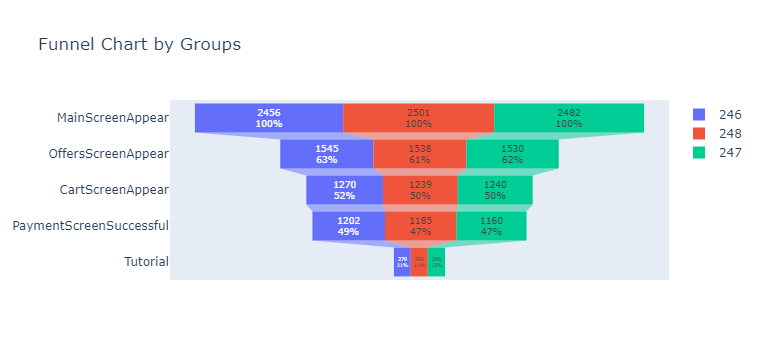

In [61]:
from plotly import graph_objects as go

fig = go.Figure()

fig.add_trace(go.Funnel(
    name = '246',
    y = funnel_by_groups['event_name'],
    x = [2456, 1545, 1270, 1202, 279],
    textinfo = "value+percent initial"))
fig.add_trace(go.Funnel(
    name = '248',
    orientation = "h",
    y = funnel_by_groups['event_name'],
    x = [2501, 1538, 1239, 1185, 282],
    textposition = "inside",
    textinfo = "value+percent initial"))

fig.add_trace(go.Funnel(
    name = '247',
    orientation = "h",
    y = funnel_by_groups['event_name'],
    x = [2482, 1530, 1240, 1160, 286],
    textposition = "inside",
    textinfo = "value+percent initial"))
fig.update_layout(title='Funnel Chart by Groups')
fig.show()

The plot shows that % of initial value in groups 248 and 247 is almost equal, the difference with group 247 is also within 2%. But we shall make a special test to find out if the difference between groups is significant or not.

We saw earlier that 45.7% of users go through all four stages to payment. The plot shows 48.9/ 47.4/ 46.7%(by group) of initiall users reach Payment stage. That means that absolute majority of users come to the final purchase stage through all four events, and only less then 2 % skip some stages on the path.

## How long did it take from mainScreen to purchase?

Let's make a pivot table for all users and all events(excluding Tutorial), aggregating values by mim date_time.

In [62]:
min_time=pd.pivot_table(data[data['event_name']!='Tutorial'],index=['uid'],columns=['event_name'],values=['date_time'],aggfunc=min)['date_time']
min_time

event_name,CartScreenAppear,MainScreenAppear,OffersScreenAppear,PaymentScreenSuccessful
uid,,,,
6888746892508752,NaT,2019-08-06 14:06:34,NaT,NaT
6909561520679493,2019-08-06 18:52:58,2019-08-06 18:52:54,2019-08-06 18:53:04,2019-08-06 18:52:58
6922444491712477,2019-08-04 14:19:40,2019-08-04 14:19:33,2019-08-04 14:19:46,2019-08-04 14:19:40
7435777799948366,NaT,2019-08-05 08:06:34,NaT,NaT
7702139951469979,2019-08-02 14:28:45,2019-08-01 04:29:54,2019-08-01 04:29:56,2019-08-02 14:28:45
...,...,...,...,...
9217594193087726423,2019-08-02 09:00:58,NaT,2019-08-02 09:01:08,2019-08-02 09:00:57
9219463515465815368,2019-08-06 16:49:40,2019-08-05 05:26:26,2019-08-06 16:48:57,2019-08-06 16:52:16
9220879493065341500,2019-08-02 17:59:16,2019-07-29 14:29:58,2019-08-02 17:59:00,NaT


We reset index and call the dataframe  new.

In [63]:
new=min_time.reset_index()
new.head()

event_name,uid,CartScreenAppear,MainScreenAppear,OffersScreenAppear,PaymentScreenSuccessful
0,6888746892508752,NaT,2019-08-06 14:06:34,NaT,NaT
1,6909561520679493,2019-08-06 18:52:58,2019-08-06 18:52:54,2019-08-06 18:53:04,2019-08-06 18:52:58
2,6922444491712477,2019-08-04 14:19:40,2019-08-04 14:19:33,2019-08-04 14:19:46,2019-08-04 14:19:40
3,7435777799948366,NaT,2019-08-05 08:06:34,NaT,NaT
4,7702139951469979,2019-08-02 14:28:45,2019-08-01 04:29:54,2019-08-01 04:29:56,2019-08-02 14:28:45


We add one more column for difference in time between Mainscreen and Payment.

In [64]:
new['time_diff']=new['PaymentScreenSuccessful']-new['MainScreenAppear']
new.head()

event_name,uid,CartScreenAppear,MainScreenAppear,OffersScreenAppear,PaymentScreenSuccessful,time_diff
0,6888746892508752,NaT,2019-08-06 14:06:34,NaT,NaT,NaT
1,6909561520679493,2019-08-06 18:52:58,2019-08-06 18:52:54,2019-08-06 18:53:04,2019-08-06 18:52:58,0 days 00:00:04
2,6922444491712477,2019-08-04 14:19:40,2019-08-04 14:19:33,2019-08-04 14:19:46,2019-08-04 14:19:40,0 days 00:00:07
3,7435777799948366,NaT,2019-08-05 08:06:34,NaT,NaT,NaT
4,7702139951469979,2019-08-02 14:28:45,2019-08-01 04:29:54,2019-08-01 04:29:56,2019-08-02 14:28:45,1 days 09:58:51


We get values in time_diff which are timedelta type

In [65]:
new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7547 entries, 0 to 7546
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype          
---  ------                   --------------  -----          
 0   uid                      7547 non-null   int64          
 1   CartScreenAppear         3749 non-null   datetime64[ns] 
 2   MainScreenAppear         7439 non-null   datetime64[ns] 
 3   OffersScreenAppear       4613 non-null   datetime64[ns] 
 4   PaymentScreenSuccessful  3547 non-null   datetime64[ns] 
 5   time_diff                3452 non-null   timedelta64[ns]
dtypes: datetime64[ns](4), int64(1), timedelta64[ns](1)
memory usage: 353.9 KB


In [66]:
new['time_diff'].value_counts()

0 days 00:00:03      133
0 days 00:00:02      133
0 days 00:00:04      119
0 days 00:00:05       93
0 days 00:00:06       73
                    ... 
3 days 04:19:43        1
0 days 00:34:41        1
-2 days +03:21:42      1
2 days 12:25:08        1
-1 days +23:59:12      1
Name: time_diff, Length: 2218, dtype: int64

Let's turn them to days with dt.days and count values.

In [67]:
new['time_diff'].dt.days.value_counts()

 0.0     2332
 1.0      339
 2.0      213
-1.0      143
 3.0      112
 4.0       75
-2.0       57
 5.0       43
-3.0       32
-4.0       25
 6.0       24
-5.0       22
-6.0       21
 7.0        5
-7.0        5
 10.0       1
-10.0       1
 8.0        1
 9.0        1
Name: time_diff, dtype: int64

We see negative values in time_diff when purchase was maid before MainScreenAppear(we've already seen such variants of the path). Here they are:

In [68]:
new[new.time_diff.dt.days<0]

event_name,uid,CartScreenAppear,MainScreenAppear,OffersScreenAppear,PaymentScreenSuccessful,time_diff
9,15708180189885246,2019-08-01 11:06:19,2019-08-01 16:08:23,2019-08-01 05:38:55,2019-08-01 11:06:19,-1 days +18:57:56
33,40352430792344971,2019-08-03 09:55:20,2019-08-06 18:26:06,2019-08-01 19:51:45,2019-08-03 09:55:19,-4 days +15:29:13
36,46236857309457992,2019-08-02 14:40:45,2019-08-06 16:38:19,2019-08-02 14:40:18,2019-08-02 14:40:44,-5 days +22:02:25
57,76430713684339660,2019-07-31 12:19:59,2019-08-02 11:13:18,2019-08-03 07:12:45,2019-07-31 12:19:59,-2 days +01:06:41
59,78033526859485994,2019-07-29 15:55:27,2019-08-03 14:56:43,2019-08-03 14:56:55,2019-07-29 15:55:27,-5 days +00:58:44
...,...,...,...,...,...,...
7390,9043126402669164803,2019-08-03 12:07:17,2019-08-05 17:11:30,2019-08-03 12:05:56,2019-08-03 12:09:20,-3 days +18:57:50
7393,9049243567321296657,2019-07-31 20:53:53,2019-08-01 16:52:54,2019-08-01 17:19:35,2019-07-31 20:53:52,-1 days +04:00:58
7424,9086697947430542892,2019-08-01 14:10:55,2019-08-06 19:57:28,2019-07-30 22:24:58,2019-08-01 14:10:54,-6 days +18:13:26
7435,9097760240767809307,2019-08-01 09:10:18,2019-08-02 13:34:04,2019-07-31 21:08:20,2019-08-01 09:10:17,-2 days +19:36:13


306 negative values out of 7547 - not  much, just 4%. 

In [69]:
306/7547

0.04054591228302637

In majority of successful cases  time_diff is 0, that is 2332 users start and finish their path to the purchase within 1 day. 339 users make it in 1 day, 213 users - in 2 days. Max time difference between the MainScreenAppear and the purchase is 10 days(1 user).

## **Conclusion**

The funnel analysis was conducted.
- Order of events by frequency of occurrence and the number of unique users is the following: 
**MainScreenAppear  >  OffersScreenAppear > CartScreenAppear > PaymentScreenSuccessfu> Tutorial**

- The proportion of users who performed the action at least once was calculated. The biggest users loss comes between the events MainScreenAppear and OffersScreenAppear(from 98% to 61%). The smallest loss comes between the events CartScreenAppear and PaymentScreenSuccessful (49.5% - 47%). Only 11% of users opened Tutorial.
- We supposed that the actions took place in the following order:
MainScreenAppear  >  OffersScreenAppear > CartScreenAppear > PaymentScreenSuccessful.
Tutorial is a special event that has no fixed place in event sequence, no logical connection with any other stage,so Tutorial was excluded from the funnel calculations on sorted_df.
- For every user its path through events was stored in path df and real unique paths were compared. Path can include 1-4 events, in all cases with 1 or 2 and in about a half of the paths with 3 events we never see PaymentScreenSuccessful. The majority of paths start with MainScreen, and in all variants including 4 events the most frequent is our expected sequence MainScreenAppear, OffersScreenAppear, CartScreenAppear, PaymentScreenSuccessful, but there are also variants where Payment is the 1st or the 2nd after MainScreen.
- The stacked funnell was plotted, the number of users at each stage and its % of initial value and previous stage is shown. Max loss of users comes afer the MainScreenAppear on transition to OffersScreenAppear - 38%, about 19% at CartScreenAppear and only 5% users lost at PaymentScreenSuccessful.
- The plot shows that % of initial value in groups 248 and 247 is almost equal, the difference with group 247 is also within 2%, these results need to be statistically tested. 
- How long did it take from mainScreen to purchase: we got 4% of negative values, when CartScreen preceeded MainScreen. In majority of cases(2332 users) users start and finish their path to the purchase within 1 day. Max time difference between the MainScreenAppear and the purchase is 10 days(1 user).

# Step 5. Study the results of the experiment
## How many users are there in each group?

In [70]:
df.groupby(['exp_id'])['uid'].nunique()

exp_id
246    2484
247    2513
248    2537
Name: uid, dtype: int64

Let's check one more time if all users belong just to one group.

In [71]:
data.groupby(['uid'])['exp_id'].nunique().reset_index()

,uid,exp_id
0,6888746892508752,1
1,6909561520679493,1
2,6922444491712477,1
3,7435777799948366,1
4,7702139951469979,1
...,...,...
7546,9217594193087726423,1
7547,9219463515465815368,1
7548,9220879493065341500,1
7549,9221926045299980007,1


In [72]:
data.groupby(['uid'])['exp_id'].nunique().reset_index().query('exp_id>1')

,uid,exp_id


No users belong to more than 1 group. So our groups are big enouph, every user belongs just to one group - these are necessary requirements for the experiment.

## We have two control groups in the A/A test, where we check our mechanisms and calculations. See if there is a statistically significant difference between samples 246 and 247.

First we compare  groups 246 and 247 (which are both A groups) with proportion test.
It compares the shares of successes in two samples and evaluates  if the samples can belong to one and the same population or not. In our case successes are purchases, samples are groups.


In [73]:
control_1=df[df.exp_id==246]['uid'].nunique()
control_2=df[df.exp_id==247]['uid'].nunique()
test=df[df.exp_id==248]['uid'].nunique()

In [74]:
control_1

2484

In [75]:
control_2

2513

Number of purchases(PaymentScreenSuccessful) in group 246 was 1200, in group 247 - 1158. So we have to compare proportions 1200/2484 and  1158/2513, are groups with such proportion of successes statistically different or not.

Let's define function check_hypothesis that evaluates proportion of successes in 2 groups.

H0: group1 and group2 don't differ(belong to the same population).
H1: groups1 and group2 are different.

In [76]:
alpha = .05 # significance level

successes = np.array([1200, 1158])
trials = np.array([2484, 2513])

# success proportion in the first group:
p1 = successes[0]/trials[0]

# success proportion in the second group:
p2 = successes[1]/trials[1]

# success proportion in the combined dataset:
p_combined = (successes[0] + successes[1]) / (trials[0] + trials[1])

# the difference between the datasets' proportions
difference = p1 - p2
# calculating the statistic in standard deviations of the standard normal distribution
#z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * (1/trials[0] + 1/trials[1]))

# setting up the standard normal distribution (mean 0, standard deviation 1)
distr = st.norm(0, 1)
# calculating the statistic in standard deviations of the standard normal distribution
z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * (1/trials[0] + 1/trials[1]))

# setting up the standard normal distribution (mean 0, standard deviation 1)
distr = st.norm(0, 1) 

p_value = (1 - distr.cdf(abs(z_value))) * 2

print('p-value: ', p_value)

if (p_value < alpha):
    print("Rejecting the null hypothesis: there is a significant difference between the proportions")
else:
    print("Failed to reject the null hypothesis: there is no reason to consider the proportions different")

p-value:  0.11456679313141849
Failed to reject the null hypothesis: there is no reason to consider the proportions different


So, p_value is greater than 0.05, we failed to reject the null hypotheses. There is no teason to consider the proportion of successes(purchases) in groups 246 and 247 different.

## Select the most popular event. In each of the control groups, find the number of users who performed this action. Find their share. Check whether the difference between the groups is statistically significant. Repeat the procedure for all other events (it will save time if you create a special function for this test). Can you confirm that the groups were split properly?

Let's make  a pivot for successes per group for all events, like we did for conversion.

In [77]:
pivot=df.pivot_table(index='event_name', columns='exp_id',values='uid',aggfunc='nunique').reset_index()
pivot

exp_id,event_name,246,247,248
0,CartScreenAppear,1266,1238,1230
1,MainScreenAppear,2450,2476,2493
2,OffersScreenAppear,1542,1520,1531
3,PaymentScreenSuccessful,1200,1158,1181
4,Tutorial,278,283,279


The most popular event is MainScreenAppear. We can treat its values in the pivot table (number of unique users who performed the action) as successes and compare groups like we did above with proportion of purchases. 

Now these values are successes, and all users in a group are trials. We need to check whether two test groups are significantly different in MainScreenAppear event.

We can access this value of success directly from our pivot table.

In [78]:
pivot[pivot.event_name=='MainScreenAppear'][246]

1    2450
Name: 246, dtype: int64

In [79]:
pivot[pivot.event_name=='MainScreenAppear'][246].iloc[0]

2450

In [80]:
pivot[pivot.event_name=='MainScreenAppear'][247].iloc[0]

2476

The shares are 2450/2484 (98.99%) and 2476/2513(98.53%). Are they statistically different or not?

Let's define function check_hypothesis  that evaluates proportion of successes  at any event for 2 groups.

H0: group1 and group2 don't differ(belong to the same population).
H1: groups1 and group2 are different.
alpha = 0.05

In [81]:
def check_hypothesis(group1,group2,event,alpha=0.05):
    success1=pivot[pivot.event_name==event][group1].iloc[0]
    success2=pivot[pivot.event_name==event][group2].iloc[0]
    
    trials1=df[df.exp_id==group1]['uid'].nunique()
    trials2=df[df.exp_id==group2]['uid'].nunique()
    
    
    # success proportion in the first group:
    p1 = success1/trials1

    # success proportion in the second group:
    p2 = success2/trials2
    
    print(success1, success2,trials1 , trials2)

    # success proportion in the combined dataset:
    p_combined = (success1 + success2) / (trials1 + trials2)

    # the difference between the datasets' proportions
    difference = p1 - p2
    # calculating the statistic in standard deviations of the standard normal distribution
    z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * (1/trials1 + 1/trials2))

    # setting up the standard normal distribution (mean 0, standard deviation 1)
    distr = st.norm(0, 1)
    # calculating the statistic in standard deviations of the standard normal distribution


    p_value = (1 - distr.cdf(abs(z_value))) * 2

    print('p-value: ', p_value)

    if (p_value < alpha):
        print("Rejecting the null hypothesis for", event,"and groups", group1,group2)
    else:
        print("Failed to reject the null hypothesis for",event,"and groups", group1,group2 )


In [82]:
check_hypothesis(246,247,'MainScreenAppear',alpha=0.05)

2450 2476 2484 2513
p-value:  0.7570597232046099
Failed to reject the null hypothesis for MainScreenAppear and groups 246 247


p_value is greater than alpha, so we failed to reject the hypothesis.

We are checking  whether there is a statistical difference in conversion( proportion of successes) between groups. For groups 246 and 247 we checked whether the share of users (from all users in the test) that had "MainScreenAppear" of one test group is statistically different from another?" The answer is no.


In this way we can compare groups by all events in pivot table.

In [83]:
for i in pivot.event_name.unique():
    check_hypothesis(246,247,i,alpha=0.05)
    print('-----------------------------')

1266 1238 2484 2513
p-value:  0.22883372237997213
Failed to reject the null hypothesis for CartScreenAppear and groups 246 247
-----------------------------
2450 2476 2484 2513
p-value:  0.7570597232046099
Failed to reject the null hypothesis for MainScreenAppear and groups 246 247
-----------------------------
1542 1520 2484 2513
p-value:  0.2480954578522181
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 247
-----------------------------
1200 1158 2484 2513
p-value:  0.11456679313141849
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 247
-----------------------------
278 283 2484 2513
p-value:  0.9376996189257114
Failed to reject the null hypothesis for Tutorial and groups 246 247
-----------------------------


We see that all events see the same result: p_value is greater than alpha,  we failed to reject the hypothesis about equality, so may conclude that **groups 246 and 247 are statistically equal**. That's great for A/A testing.


## Do the same thing for the group with altered fonts. Compare the results with those of each of the control groups for each event in isolation. Compare the results with the combined results for the control groups. What conclusions can you draw from the experiment?

Now we can test another pair of groups, one control group(246) and the test group(248).
Users of group 248 saw screen with altered fonts, so maybe this fact influenced their behavior and number of successes on each stage is different from that of control group.
This time it is A/B testing.

In [84]:
for i in pivot.event_name.unique():
    check_hypothesis(246,248,i,alpha=0.05)
    print('-----------------------------')

1266 1230 2484 2537
p-value:  0.07842923237520116
Failed to reject the null hypothesis for CartScreenAppear and groups 246 248
-----------------------------
2450 2493 2484 2537
p-value:  0.2949721933554552
Failed to reject the null hypothesis for MainScreenAppear and groups 246 248
-----------------------------
1542 1531 2484 2537
p-value:  0.20836205402738917
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 248
-----------------------------
1200 1181 2484 2537
p-value:  0.2122553275697796
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 248
-----------------------------
278 279 2484 2537
p-value:  0.8264294010087645
Failed to reject the null hypothesis for Tutorial and groups 246 248
-----------------------------


The proportion test has shown that there is **no statistically significant difference between groups 246(A) and 248(B)**.
We can also take for testing groups 247(A) and 248(B).

In [85]:
for i in pivot.event_name.unique():
    check_hypothesis(247,248,i,alpha=0.05)
    print('-----------------------------')

1238 1230 2513 2537
p-value:  0.5786197879539783
Failed to reject the null hypothesis for CartScreenAppear and groups 247 248
-----------------------------
2476 2493 2513 2537
p-value:  0.4587053616621515
Failed to reject the null hypothesis for MainScreenAppear and groups 247 248
-----------------------------
1520 1531 2513 2537
p-value:  0.9197817830592261
Failed to reject the null hypothesis for OffersScreenAppear and groups 247 248
-----------------------------
1158 1181 2513 2537
p-value:  0.7373415053803964
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 247 248
-----------------------------
283 279 2513 2537
p-value:  0.765323922474501
Failed to reject the null hypothesis for Tutorial and groups 247 248
-----------------------------


Here p_value is even greater, the result is the same: **no statistically significant difference between groups 246(A) and 248(B)**. We may conclude that altered font didn't help to increase conversion, the users behaviour didn't change.

## What significance level have you set to test the statistical hypotheses mentioned above? Calculate how many statistical hypothesis tests you carried out. With a statistical significance level of 0.1, one in 10 results could be false. What should the significance level be? If you want to change it, run through the previous steps again and check your conclusions.

In hypotheses testing we used significance level alpha 0.05. In A/A/B testing we tested 3 pairs of groups: 246/247(A/A), 246/248(A/B), 247/248(A/B) at 5 different events, so there is a total of 15 statistical hypothesis tests carried out.

We can take statistical significance level of 0.1 and run the tests once again, it's not so difficult with check_hypothesis function.

In [86]:
for i in pivot.event_name.unique():
    check_hypothesis(246,247,i,alpha=0.1)
    print('-----------------------------')

1266 1238 2484 2513
p-value:  0.22883372237997213
Failed to reject the null hypothesis for CartScreenAppear and groups 246 247
-----------------------------
2450 2476 2484 2513
p-value:  0.7570597232046099
Failed to reject the null hypothesis for MainScreenAppear and groups 246 247
-----------------------------
1542 1520 2484 2513
p-value:  0.2480954578522181
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 247
-----------------------------
1200 1158 2484 2513
p-value:  0.11456679313141849
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 247
-----------------------------
278 283 2484 2513
p-value:  0.9376996189257114
Failed to reject the null hypothesis for Tutorial and groups 246 247
-----------------------------


In [87]:
for i in pivot.event_name.unique():
    check_hypothesis(246,248,i,alpha=0.1)
    print('-----------------------------')

1266 1230 2484 2537
p-value:  0.07842923237520116
Rejecting the null hypothesis for CartScreenAppear and groups 246 248
-----------------------------
2450 2493 2484 2537
p-value:  0.2949721933554552
Failed to reject the null hypothesis for MainScreenAppear and groups 246 248
-----------------------------
1542 1531 2484 2537
p-value:  0.20836205402738917
Failed to reject the null hypothesis for OffersScreenAppear and groups 246 248
-----------------------------
1200 1181 2484 2537
p-value:  0.2122553275697796
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 246 248
-----------------------------
278 279 2484 2537
p-value:  0.8264294010087645
Failed to reject the null hypothesis for Tutorial and groups 246 248
-----------------------------


In [88]:
for i in pivot.event_name.unique():
    check_hypothesis(247,248,i,alpha=0.01)
    print('-----------------------------')

1238 1230 2513 2537
p-value:  0.5786197879539783
Failed to reject the null hypothesis for CartScreenAppear and groups 247 248
-----------------------------
2476 2493 2513 2537
p-value:  0.4587053616621515
Failed to reject the null hypothesis for MainScreenAppear and groups 247 248
-----------------------------
1520 1531 2513 2537
p-value:  0.9197817830592261
Failed to reject the null hypothesis for OffersScreenAppear and groups 247 248
-----------------------------
1158 1181 2513 2537
p-value:  0.7373415053803964
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups 247 248
-----------------------------
283 279 2513 2537
p-value:  0.765323922474501
Failed to reject the null hypothesis for Tutorial and groups 247 248
-----------------------------


What if we combine two control groups 246 and 247(we have already proven that they belong to the same population) in one group?

Our check_hypothesis function takes values from df and pivot table, and we have to prepare them to combined testing of A and B groups.

Let's make a copy of 'exp_id' column to store initial group names in df(in case we need them sometime) and then replace values 246,247 with A and 248 with B. 

In [89]:
df['exp_id_old'] = df['exp_id']
replacement_dict = {246: 'A', 247: 'A', 248: 'B'}

In [90]:
df['exp_id'] = df['exp_id_old'].map(replacement_dict)
df.head(2)

,event_name,uid,timestamp,exp_id,date_time,date,exp_id_old
2828,Tutorial,3737462046622621720,1564618048,A,2019-08-01 00:07:28,2019-08-01,246
2829,MainScreenAppear,3737462046622621720,1564618080,A,2019-08-01 00:08:00,2019-08-01,246


We have to make a new pivot table for groups A,B just by repeating the code

In [91]:
pivot=df.pivot_table(index='event_name', columns='exp_id',values='uid',aggfunc='nunique').reset_index()
pivot

exp_id,event_name,A,B
0,CartScreenAppear,2504,1230
1,MainScreenAppear,4926,2493
2,OffersScreenAppear,3062,1531
3,PaymentScreenSuccessful,2358,1181
4,Tutorial,561,279


Now we can use check_hypothesis function to compare A and B groups:

In [92]:
for i in pivot.event_name.unique():
    check_hypothesis('A', 'B', i,alpha=0.5)
    print('-----------------------------')

2504 1230 4997 2537
p-value:  0.18175875284404386
Rejecting the null hypothesis for CartScreenAppear and groups A B
-----------------------------
4926 2493 4997 2537
p-value:  0.29424526837179577
Rejecting the null hypothesis for MainScreenAppear and groups A B
-----------------------------
3062 1531 4997 2537
p-value:  0.43425549655188256
Rejecting the null hypothesis for OffersScreenAppear and groups A B
-----------------------------
2358 1181 4997 2537
p-value:  0.6004294282308704
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups A B
-----------------------------
561 279 4997 2537
p-value:  0.764862472531507
Failed to reject the null hypothesis for Tutorial and groups A B
-----------------------------


At all events we failed to reject the null hypothesis. Let's increase alpha to 0.1 and runn the function once again.

In [93]:
for i in pivot.event_name.unique():
    check_hypothesis('A', 'B', i,alpha=0.1)
    print('-----------------------------')

2504 1230 4997 2537
p-value:  0.18175875284404386
Failed to reject the null hypothesis for CartScreenAppear and groups A B
-----------------------------
4926 2493 4997 2537
p-value:  0.29424526837179577
Failed to reject the null hypothesis for MainScreenAppear and groups A B
-----------------------------
3062 1531 4997 2537
p-value:  0.43425549655188256
Failed to reject the null hypothesis for OffersScreenAppear and groups A B
-----------------------------
2358 1181 4997 2537
p-value:  0.6004294282308704
Failed to reject the null hypothesis for PaymentScreenSuccessful and groups A B
-----------------------------
561 279 4997 2537
p-value:  0.764862472531507
Failed to reject the null hypothesis for Tutorial and groups A B
-----------------------------


Again we failed to reject the null hypothesis. So **combined A group(246 + 247) and B group(248) are not statistically different at all stages of event funnel.**

Almost all tests give us the same result 'Failed to reject the null hypothesis', only 1 test has changed. A/B test of groups 246,248 at event  CartScreenAppear gives p-value  0.07842923237520116 which is smaller than 0.1, so the null hypothesis should be rejected. Earlier, with alpha = 0.05 the same p_value 0.07842923237520116 lead to the opposit result. Which to chose?

When we increase alpha we also encrease the probability of type 1 error(to reject the true H0), but at the same time we decrease the probability of type 2 error (to accept the wrong H0). Type 1 error can be crucial for medical researches, but it is not so important for business. In our case if we reject the true HO and conclude that the groups are different, the font has really changed users behaviour(while it really has not), we implement the new font  but will not gain anything. But if we accept the wrong H0 (Type 2 error) and conclude that the groups don't differ, while they are really different, we lose the opportunity to gain profit from the new font, so there is a potential loss of money.

So, if we increase alfa to 0.1 we increase the probability of type 1 error, which is not so important for us, and decrease the probability of type 2 error, which is more dangerous. In our case increasing alfa to 0.1 can be accepted, it won't harm our business.

What shall we do with different test results? We tested results at 5 stages(5 events), but only 1 of them is negative in 246/248 testing(A/B). Comparing 247/248 groups(also A/B) and combined A/B testing gives only positive results at all 5 stages, so the general conclusion shall be 'Failed to reject Ho'.

There's no need to implement Bonferroni correction or any other correction in our A/A/B testing (as we do when multiple tests may skew the results), because we compare proportions, that is the share of all of successes among all trials (all unique users), and this  share doesn't change with number of tests carried out.


## Conclusion

We used proportion test to comparegroups 246(A),247(A) and 248(B).
- First we compared the proportion of purcases in groups 246 and 247. With alpha = 0.05 we failed to reject the null hypotheses, no statistically significant difference found.
- The most popular events - MainScreenAppear - were compared. Number of unique users was treated as success, all users as trials. Again p_value is greater than 0.05, we failed to reject the null hypotheses. 
- The function function check_hypothesis was defined to check proportion of successes in two groups at any funnel stage. All events see the same result: p_value is greater than alpha,  we failed to reject the hypothesis about equality, so may conclude that **groups 246 and 247 are statistically equal**. That's great for A/A testing.
- A/B testing. The function was applied to compare two pairs of groups 246/248 and 247/248. With alpha = 0.05 all pairs at all events see the same result: failed to reject the null hypotheses, so there is no 
statistically significant difference between control and test group.
- Alpha was increased to 0.1, all 15 tests were repeated. In 1 test the result has changed: A/B test of groups 246,248 at event  CartScreenAppear gives p-value  0.07842923237520116 which is smaller than 0.1, so the null hypothesis should be rejected.
- Groups 246 and 247 were combined in one A group and a new series of combined tests was conducted with alpha = 0.05 and alpha =0.1. At all stages with both alpha values we got the same result: failed to reject the null hypotheses.
- Althouh by increasing alpha we also encrease the probability of type 1 error and decrease the probability of type 2 error(which is not so crucial for business), we make conclusion that test group is not really different from control group. Contradictory results appear in just 1 of 10 A/B tests, so it is reasonable to follow the common trend. 


# General conclusion

We investigated user behavior for the company's app with log data including 224126 rows 4 columns. After preprocessing 0.16% of initial data was lost, date and time columns added, so there were 243713 rows 6 columns of data.
A. The core paramerers were analyzed.
- There are 5 different events in data: 1.MainScreenAppear > 2.OffersScreenAppear > 3.CartScreenAppear > 4.PaymentScreenSuccessful. The 5th event - Tutorial - is optional. MainScreenAppear is the most frequent event(119101), Tutorial is 100 times less frequent.
- There are 7551 users in the log distributed by 3 groups almost equally. The total numbers of events per group are also comparable.
- The number of events per user varies from 1 to 2307, the mean = 32, the median = 20 events.
The number of unique events per user varies from 1 to 5.
- Data covers the period of time from 25.07.2019 to 7.08.2019. July data is incomplete, it differs a lot from the logs that go since 01.08.2019, so it was  excluded from the further analysis.
Filtered df contains 240887 rows (2826 rows or 1,16% of events were dropped, 17 users or 0.2 % of initial number were lost). 
B. The funnel analysis was conducted.
Order of events by frequency of occurrence and the number of unique users is the following: MainScreenAppear > OffersScreenAppear > CartScreenAppear > PaymentScreenSuccessfu> Tutorial

Only 11% of users opened Tutorial, it is a special event that has no fixed place in event sequence, so Tutorial was excluded from the funnel calculations on sorted_df.

We supposed that the actions took place in the following order: MainScreenAppear > OffersScreenAppear > CartScreenAppear > PaymentScreenSuccessful. Real user paths through events were analyzed, which included 1/2/3/4 stages. The majority of paths start with MainScreen, and in all variants including 4 events the most frequent is our expected sequence MainScreenAppear, OffersScreenAppear, CartScreenAppear, PaymentScreenSuccessful,  but there are also another variants.

45.7% of users make the entire journey from their first event to payment within 1 day. Max time difference between the MainScreenAppear and the purchase is 10 days(1 user). In 4% of cases this distance is negative, when CartScreen event comes befor MainScreen event.

The stacked funnell for 3 groups was plotted, the number of users at each stage and its % of initial value and previous stage is shown. Max loss of users comes after the MainScreenAppear on transition to OffersScreenAppear - 38%, about 19% at CartScreenAppear and only 5% users lost at PaymentScreenSuccessful. So the transition from MainScreen to OffersScreen needs special attention, there's a room for conversion  improvement.

C. We used proportion test to compare groups 246(A),247(A) and 248(B).
Number of successes is understood as not only number of purchases, but also as number of unique users at each funnel event. To compare the proportion of successes among all trials(total number of users) a special function check_hypothesis was defined.

A/A analysis: groups 246 and 247 were tested, with alpha = 0.05 we failed to reject the null hypotheses, no statistically significant difference found at all stages.
A/B analysis: groups 246 and 248, 247 and 248 were tested. With alpha = 0.05 we failed to reject the null hypotheses, no statistically significant difference found at all stages.

Alpha was increased to 0.1 and all 15 tests were repeated. In 1 test the resalt has changed: A/B test of groups 246,248 at event CartScreenAppear gives p-value 0.0784 which is smaller than 0.1, so the null hypothesis should be rejected. Despite this we make a conclusion that test group is not really different from control group. Contradictory results appear in just 1 of 10 A/B tests where alpha exceeds p_value by a small amount, so it is reasonable to agree with the conclusions of the majority.

Combined A/B analysis: groups A(246+27) and B(248) were tested. With alpha = 0.05 and alpha = 0.1 we failed to reject the null hypotheses, no statistically significant difference found at all stages.

**So, there is no statistically significant difference between control and test groups, and new fonts didn't really influence user behavior**.
